In [1]:
# import the transcriptome data
import os
import dandelion as ddl
import pandas as pd
import scanpy as sc
sc.logging.print_header()

scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.18.5 scipy==1.4.1 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.7.1 leidenalg==0.8.2


In [2]:
ddl.__version__

'0.0.26'

In [3]:
os.getcwd()

'/lustre/scratch117/cellgen/team297/kt16/newcastle_covid/notebooks'

In [4]:
os.chdir('/lustre/scratch117/cellgen/team297/kt16/newcastle_covid')

In [5]:
# already populated because i ran through the whole notebook without realizing the mistake in sanger bcr barcodes not matching up
adata = sc.read_h5ad('h5ad/combined_dec.h5ad')
adata

AnnData object with n_obs × n_vars = 850100 × 31279
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome'
    var: 'feature_types'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [23]:
adata[:,adata.var.feature_types == 'Antibody Capture']

View of AnnData object with n_obs × n_vars = 850100 × 192
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome'
    var: 'feature_types'
    uns: 'Site_colors', 'leiden_colors', 'initial_clustering_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

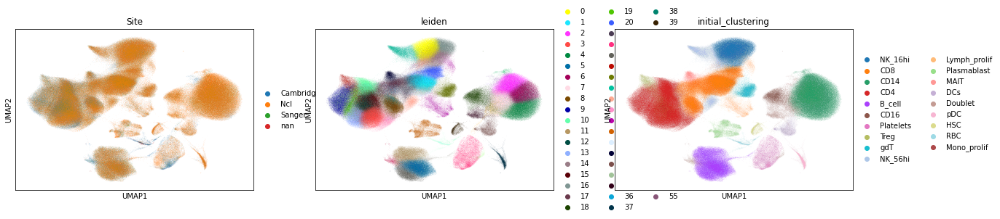

In [7]:
sc.pl.umap(adata, color = ['Site', 'leiden', 'initial_clustering'])

In [14]:
# Read in the original sample info for Newcastle data
sampleInfo = pd.read_csv('sample_id_table.csv')
import re
# collapse the patient ids fior newcastle
sampleInfo['patient id'] = [re.sub('v[0-9]|V[0-9]|-[19]0[hm]', '', x) for x in sampleInfo['PATIENT ID']]
sampleInfo

,PATIENT ID,GEX SANGER ID,CITE ID,TCR ID,BCR ID,patient id
0,COVID-002,MH9143270,MH9143278,MH9143286,MH9143294,COVID-002
1,COVID-003,MH8919326,MH8919334,MH8919342,MH8919350,COVID-003
2,COVID-004,MH9179821,MH9179829,MH9179838,MH9185499,COVID-004
3,COVID-004v2,newcastle004v2,newcastle004v2,newcastle004v2,newcastle004v2,COVID-004
4,COVID-007,MH9143320,MH9143328,MH9143336,MH9143344,COVID-007
...,...,...,...,...,...,...
67,IVLPS-3-90m,MH8919232,MH8919240,MH8919248,MH8919256,IVLPS-3
68,IVLPS-4-10h,MH8919277,MH8919285,MH8919293,MH9183190,IVLPS-4
69,IVLPS-4-90m,MH8919276,MH8919284,MH8919292,MH9183189,IVLPS-4
70,IVLPS-6-10h,MH8919279,MH8919287,MH8919295,MH9183192,IVLPS-6


In [19]:
# prepare the file paths for the reading
samples1 = ['BCR_' + str(s) for s in sampleInfo['BCR ID']]
samples2 = sorted(list(set(adata[(adata.obs['Site'].isin(['Cambridge', 'Sanger'])) & ~(adata.obs['patient_id'].isin(['unassigned', 'nan']))].obs['patient_id'])))
# concatenate into a single list
samples = samples1 + samples2

In [24]:
bcr_files = []
for sample in samples:
    filelocation1 = 'newcastle/BCR/'+ sample +'/dandelion/data/filtered_contig_igblast_db-pass_genotyped.tsv'
    filelocation2 = 'cambridge/BCR/'+ sample +'/dandelion/data/filtered_contig_igblast_db-pass_genotyped.tsv'
    filelocation3 = 'sanger/bcrData/'+ sample +'/dandelion/data/filtered_contig_igblast_db-pass_genotyped.tsv'
    if os.path.isfile(filelocation1):
        bcr_files.append(pd.read_csv(filelocation1, sep = '\t'))        
    elif os.path.isfile(filelocation2):
        bcr_files.append(pd.read_csv(filelocation2, sep = '\t'))
    elif os.path.isfile(filelocation3):
        bcr_files.append(pd.read_csv(filelocation3, sep = '\t'))
    else:
        pass

In [25]:
# concatenate and check if the table is constructed properly
bcr = bcr_files[0].append(bcr_files[1:])
bcr.reset_index(inplace = True, drop = True)
bcr.shape

(333726, 81)

In [26]:
# to speed this up slightly, I will also remove the barcodes that not found in the transcriptome data
bcr = bcr[bcr['cell_id'].isin(list(set(adata.obs_names)))]
bcr.shape

(233304, 81)

In [27]:
# need to do this to run the next step
adata.obs['filter_rna'] = False

In [32]:
vdj, bdata = ddl.pp.filter_bcr(bcr, adata, filter_rna = False)

Scanning for poor quality/ambiguous contigs with 63 cpus


Annotating in anndata obs slot : 100%|██████████| 850100/850100 [10:56<00:00, 1294.31it/s]


Finishing up filtering
Initializing Dandelion object


In [33]:
# number of cells that were matched with bcr
pd.crosstab(bdata.obs['has_bcr'], bdata.obs['bcr_QC_pass'])

bcr_QC_pass,False,True
has_bcr,,
False,748540,0
True,36339,65221


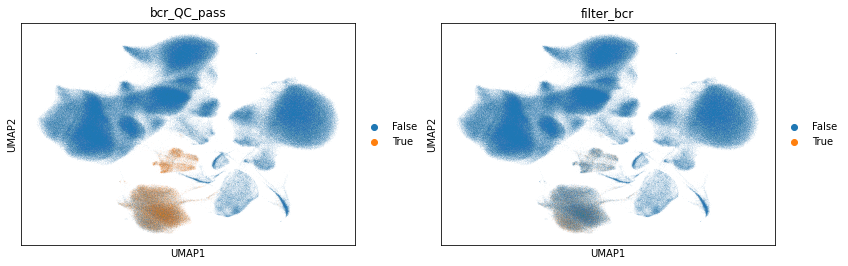

In [34]:
# number of cells that were matched with bcr that passed QC
sc.pl.umap(bdata, color=['bcr_QC_pass', 'filter_bcr'])

In [35]:
# save
bdata.write('h5ad/combined_dec.h5ad', compression = 'gzip')

In [36]:
vdj.write_h5('dandelion_output/combined_dec_vdj.h5', complib = 'blosc:lz4')

In [1]:
# import the transcriptome data
import os
import dandelion as ddl
import pandas as pd
import scanpy as sc
sc.logging.print_header()

scanpy==1.6.0 anndata==0.7.4 umap==0.4.6 numpy==1.18.5 scipy==1.4.1 pandas==1.1.3 scikit-learn==0.23.2 statsmodels==0.12.0 python-igraph==0.7.1 leidenalg==0.8.2


In [2]:
ddl.__version__

'0.0.25'

In [3]:
os.getcwd()

'/lustre/scratch117/cellgen/team297/kt16/newcastle_covid/notebooks'

In [4]:
os.chdir('/lustre/scratch117/cellgen/team297/kt16/newcastle_covid')

In [5]:
# already populated because i ran through the whole notebook without realizing the mistake in sanger bcr barcodes not matching up
adata = sc.read_h5ad('h5ad/combined_dec.h5ad')
adata

AnnData object with n_obs × n_vars = 850100 × 31279
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr'
    var: 'feature_types'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

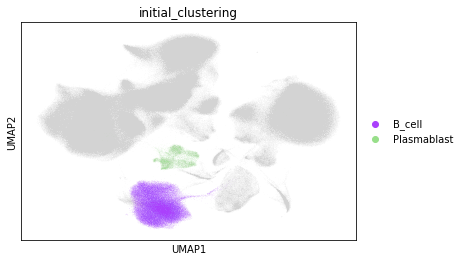

In [6]:
sc.pl.umap(adata, color = 'initial_clustering', groups = ['B_cell', 'Plasmablast'])

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


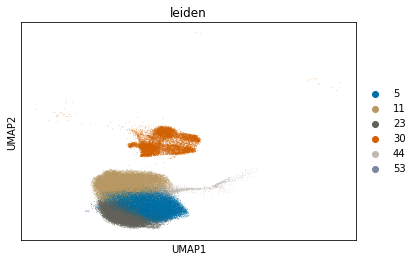

In [7]:
# Check B cell clusters
sc.pl.umap(adata[adata.obs['initial_clustering'].isin(['B_cell', 'Plasmablast'])], color = 'leiden')

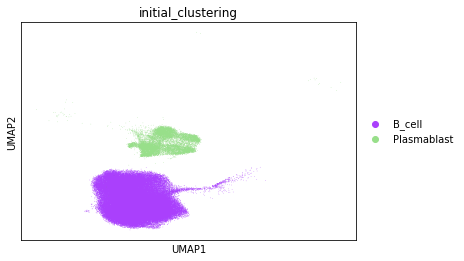

In [8]:
sc.pl.umap(adata[adata.obs['leiden'].isin(['5','11','23','30','44','53'])], color = 'initial_clustering')

In [9]:
# separate rna and protein
rna = adata[:, adata.var.feature_types == 'Gene Expression']
protein = adata[:, adata.var.feature_types == 'Antibody Capture']

In [10]:
# subset to just the B cells
# also remove unassigned and B lymphoma
bdata = rna[(rna.obs['initial_clustering'].isin(['B_cell', 'Plasmablast'])) & ~(rna.obs['patient_id'].isin(['CV0198', 'nan']))].copy()
bprotein = protein[(protein.obs['initial_clustering'].isin(['B_cell', 'Plasmablast'])) & ~(protein.obs['patient_id'].isin(['CV0198', 'nan']))].copy()
bdata

AnnData object with n_obs × n_vars = 89661 × 31087
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr'
    var: 'feature_types'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [11]:
# Normalize the RNA counts
sc.pp.normalize_total(bdata, target_sum=1e4)
# Logarithmize the data
sc.pp.log1p(bdata)

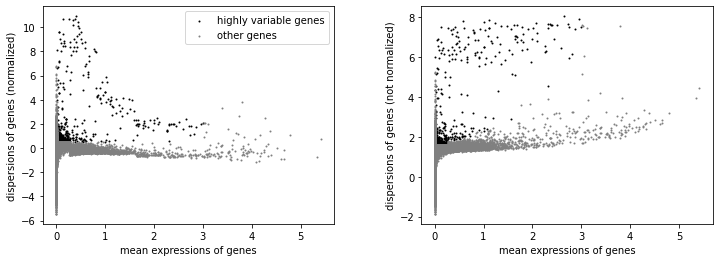

In [12]:
# find highly variable genes
sc.pp.highly_variable_genes(bdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(bdata)

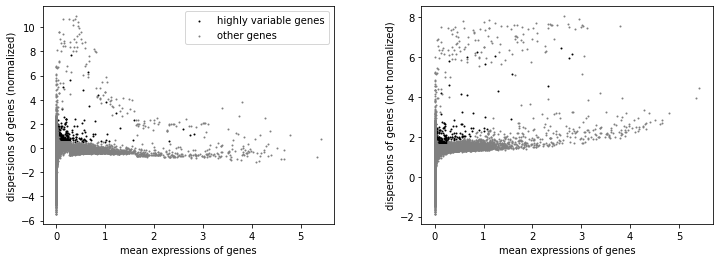

In [13]:
# remove vdj and light chain constant genes from highly variable genes
import re
for i in bdata.var.index:
    if re.search('^IG[HKL][VDJC]', i):
        bdata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(bdata)

In [14]:
# transfer to .raw slot
bdata.raw = bdata

In [15]:
# Filter the rna genes to only those marked as highly-variable
bdata = bdata[:, bdata.var.highly_variable]
bdata

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


View of AnnData object with n_obs × n_vars = 89661 × 1137
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr'
    var: 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors', 'log1p', 'hvg'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [16]:
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(bdata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(bdata, max_value=10)

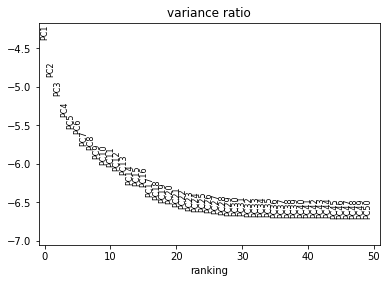

In [17]:
# Run PCA
sc.tl.pca(bdata, svd_solver='arpack')
sc.pl.pca_variance_ratio(bdata, log=True, n_pcs = 50)

In [18]:
# Correcting the PCs with harmonypy
sc.external.pp.harmony_integrate(bdata, 'sample_id')
# Computing the neighborhood graph
sc.pp.neighbors(bdata, n_neighbors=10, n_pcs=30, use_rep = 'X_pca_harmony')
# Embedding the neighborhood graph
sc.tl.umap(bdata, min_dist = 0.3)

2020-12-13 17:10:30,131 - harmonypy - INFO - Iteration 1 of 10
2020-12-13 17:11:36,382 - harmonypy - INFO - Iteration 2 of 10
2020-12-13 17:12:40,604 - harmonypy - INFO - Iteration 3 of 10
2020-12-13 17:13:43,924 - harmonypy - INFO - Iteration 4 of 10
2020-12-13 17:14:35,131 - harmonypy - INFO - Iteration 5 of 10
2020-12-13 17:15:23,069 - harmonypy - INFO - Iteration 6 of 10
2020-12-13 17:16:08,207 - harmonypy - INFO - Iteration 7 of 10
2020-12-13 17:16:53,354 - harmonypy - INFO - Iteration 8 of 10
2020-12-13 17:17:38,906 - harmonypy - INFO - Iteration 9 of 10
2020-12-13 17:18:26,386 - harmonypy - INFO - Iteration 10 of 10
2020-12-13 17:19:09,392 - harmonypy - INFO - Stopped before convergence


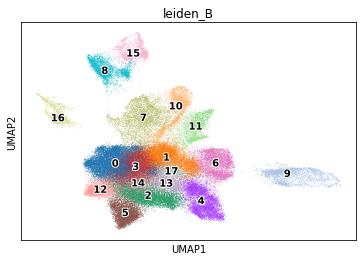

In [19]:
sc.tl.leiden(bdata, key_added = 'leiden_B')
sc.pl.umap(bdata, color = 'leiden_B', legend_loc = 'on data', legend_fontoutline = 2)

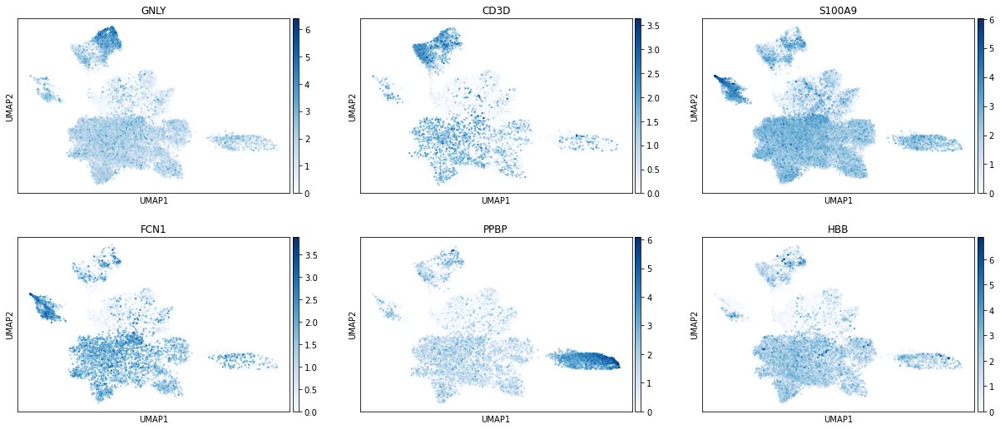

In [20]:
sc.pl.umap(bdata, color=['GNLY', 'CD3D', 'S100A9', 'FCN1', 'PPBP', 'HBB'], color_map = 'Blues', size = 20, ncols = 3)

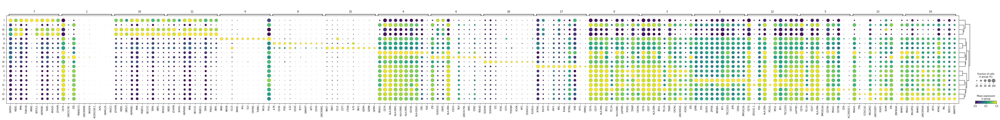

In [21]:
sc.tl.rank_genes_groups(bdata, groupby = 'leiden_B')
sc.pl.rank_genes_groups_dotplot(bdata, min_logfoldchange =.58, n_genes=10, standard_scale = 'var',  color_map = 'viridis')

In [23]:
# update those cells as doublets
bdata.obs['initial_clustering_B'] = bdata.obs['initial_clustering'].astype('object')
for i in bdata.obs.index:
    if bdata.obs.at[i, 'leiden_B'] == '8' or bdata.obs.at[i, 'leiden_B'] == '15' or bdata.obs.at[i, 'leiden_B'] == '9' or bdata.obs.at[i, 'leiden_B'] == '16':
        bdata.obs.at[i, 'initial_clustering_B'] = 'Doublet'

In [24]:
# update the original object's labels too
adata.obs['initial_clustering_B'] = adata.obs['initial_clustering'].astype('object')
adata.obs['initial_clustering_B'].update(bdata.obs['initial_clustering_B'].astype('object'))

### Filtering round 2

In [25]:
# subset to just the B cells
# separate rna and protein
rna = adata[:, adata.var.feature_types == 'Gene Expression']
protein = adata[:, adata.var.feature_types == 'Antibody Capture']
# also remove unassigned and B lymphoma
bdata = rna[(rna.obs['initial_clustering_B'].isin(['B_cell', 'Plasmablast'])) & ~(rna.obs['patient_id'].isin(['CV0198', 'nan']))].copy()
bprotein = protein[(protein.obs['initial_clustering_B'].isin(['B_cell', 'Plasmablast'])) & ~(protein.obs['patient_id'].isin(['CV0198', 'nan']))].copy()
bdata

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


AnnData object with n_obs × n_vars = 76714 × 31087
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr', 'initial_clustering_B'
    var: 'feature_types'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [26]:
# Normalize the RNA counts
sc.pp.normalize_total(bdata, target_sum=1e4)
# Logarithmize the data
sc.pp.log1p(bdata)

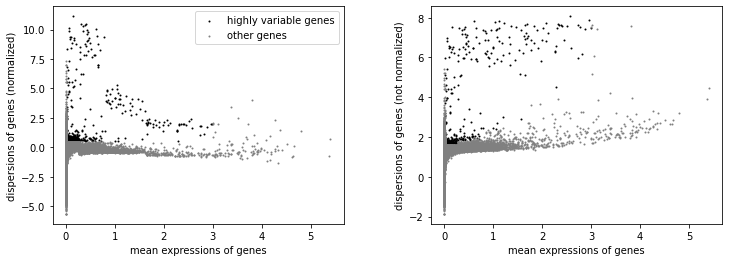

In [27]:
# find highly variable genes
sc.pp.highly_variable_genes(bdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(bdata)

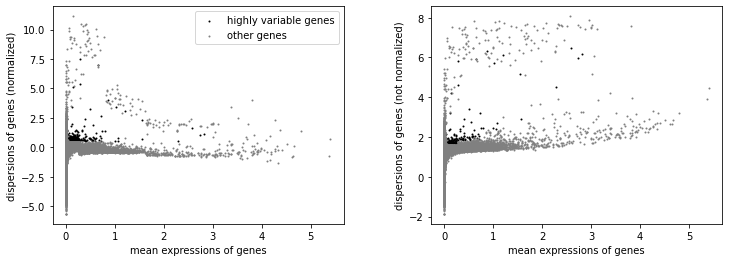

In [28]:
# remove vdj and light chain constant genes from highly variable genes
import re
for i in bdata.var.index:
    if re.search('^IG[HKL][VDJC]', i):
        bdata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(bdata)

In [29]:
# transfer to .raw slot
bdata.raw = bdata

In [30]:
# Filter the rna genes to only those marked as highly-variable
bdata = bdata[:, bdata.var.highly_variable]
bdata

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


View of AnnData object with n_obs × n_vars = 76714 × 1031
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr', 'initial_clustering_B'
    var: 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors', 'log1p', 'hvg'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [31]:
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(bdata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(bdata, max_value=10)

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering_B' as categorical


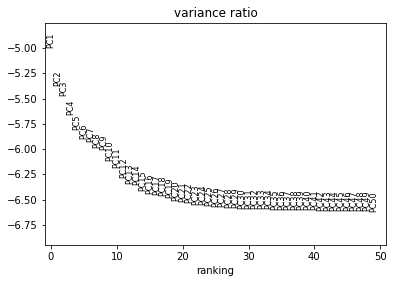

In [32]:
# Run PCA
sc.tl.pca(bdata, svd_solver='arpack')
sc.pl.pca_variance_ratio(bdata, log=True, n_pcs = 50)

In [33]:
# Correcting the PCs with harmonypy
sc.external.pp.harmony_integrate(bdata, 'sample_id')
# Computing the neighborhood graph
sc.pp.neighbors(bdata, n_neighbors=10, n_pcs=30, use_rep = 'X_pca_harmony')
# Embedding the neighborhood graph
sc.tl.umap(bdata, min_dist = 0.3)

2020-12-13 17:28:38,396 - harmonypy - INFO - Iteration 1 of 10
2020-12-13 17:29:35,744 - harmonypy - INFO - Iteration 2 of 10
2020-12-13 17:30:31,117 - harmonypy - INFO - Converged after 2 iterations


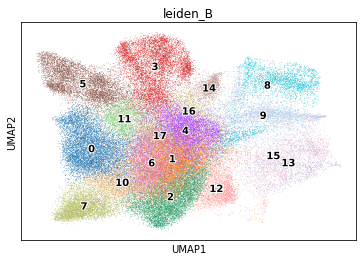

In [34]:
sc.tl.leiden(bdata, key_added = 'leiden_B')
sc.pl.umap(bdata, color = 'leiden_B', legend_loc = 'on data', legend_fontoutline = 2)

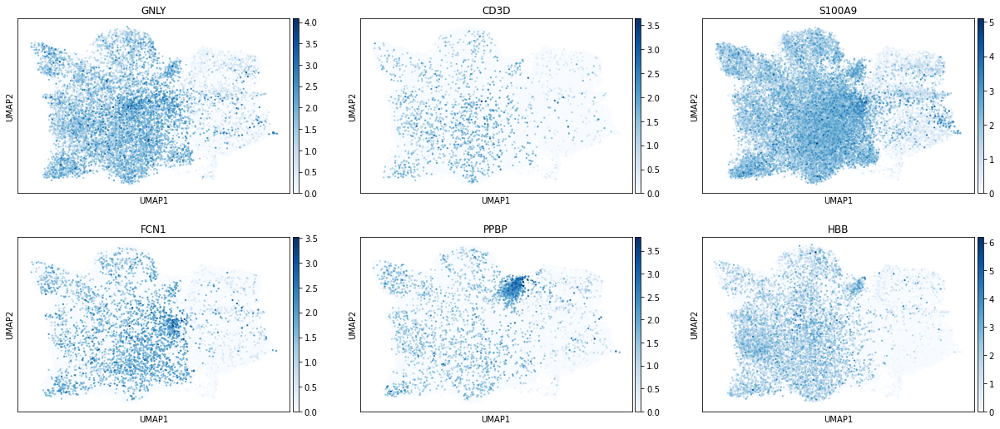

In [35]:
sc.pl.umap(bdata, color=['GNLY', 'CD3D', 'S100A9', 'FCN1', 'PPBP', 'HBB'], color_map = 'Blues', size = 20, ncols = 3)

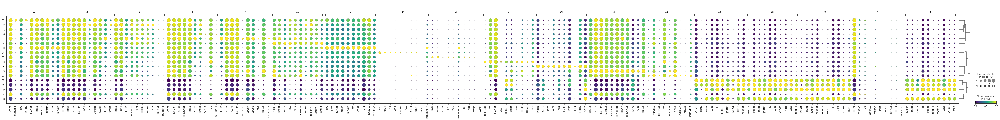

In [36]:
sc.tl.rank_genes_groups(bdata, groupby = 'leiden_B')
sc.pl.rank_genes_groups_dotplot(bdata, min_logfoldchange =.58, n_genes=10, standard_scale = 'var',  color_map = 'viridis')

In [37]:
# update those cells as doublets
bdata.obs['initial_clustering_B'] = bdata.obs['initial_clustering_B'].astype('object')
for i in bdata.obs.index:
    if bdata.obs.at[i, 'leiden_B'] == '14' or bdata.obs.at[i, 'leiden_B'] == '17' :
        bdata.obs.at[i, 'initial_clustering_B'] = 'Doublet'

In [38]:
# update the original object's labels too
adata.obs['initial_clustering_B'] = adata.obs['initial_clustering_B'].astype('object')
adata.obs['initial_clustering_B'].update(bdata.obs['initial_clustering_B'].astype('object'))

### Filtering round 3

In [39]:
# subset to just the B cells
# separate rna and protein
rna = adata[:, adata.var.feature_types == 'Gene Expression']
protein = adata[:, adata.var.feature_types == 'Antibody Capture']
# also remove unassigned and B lymphoma
bdata = rna[(rna.obs['initial_clustering_B'].isin(['B_cell', 'Plasmablast'])) & ~(rna.obs['patient_id'].isin(['CV0198', 'nan']))].copy()
bprotein = protein[(protein.obs['initial_clustering_B'].isin(['B_cell', 'Plasmablast'])) & ~(protein.obs['patient_id'].isin(['CV0198', 'nan']))].copy()
bdata

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


AnnData object with n_obs × n_vars = 74019 × 31087
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr', 'initial_clustering_B'
    var: 'feature_types'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [40]:
# Normalize the RNA counts
sc.pp.normalize_total(bdata, target_sum=1e4)
# Logarithmize the data
sc.pp.log1p(bdata)

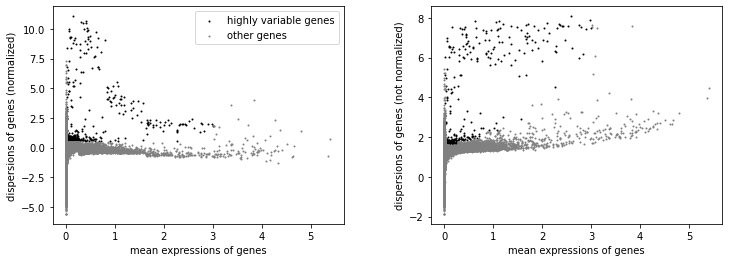

In [41]:
# find highly variable genes
sc.pp.highly_variable_genes(bdata, min_mean=0.0125, max_mean=3, min_disp=0.5)
sc.pl.highly_variable_genes(bdata)

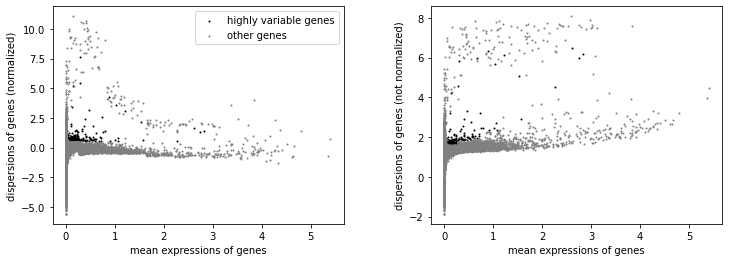

In [42]:
# remove vdj and light chain constant genes from highly variable genes
import re
for i in bdata.var.index:
    if re.search('^IG[HKL][VDJC]', i):
        bdata.var.at[i, 'highly_variable'] = False
sc.pl.highly_variable_genes(bdata)

In [43]:
# transfer to .raw slot
bdata.raw = bdata

In [44]:
# Filter the rna genes to only those marked as highly-variable
bdata = bdata[:, bdata.var.highly_variable]
bdata

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


View of AnnData object with n_obs × n_vars = 74019 × 1064
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr', 'initial_clustering_B'
    var: 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors', 'log1p', 'hvg'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [45]:
# Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.
sc.pp.regress_out(bdata, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(bdata, max_value=10)

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1210: ImplicitModificationWarning: Initializing view as actual.
Trying to set attribute `.obs` of view, copying.
... storing 'initial_clustering_B' as categorical


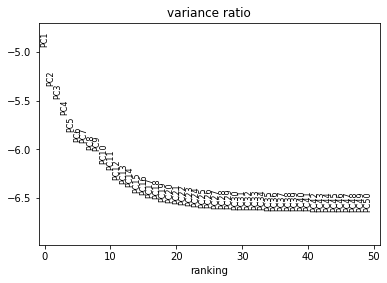

In [46]:
# Run PCA
sc.tl.pca(bdata, svd_solver='arpack')
sc.pl.pca_variance_ratio(bdata, log=True, n_pcs = 50)

In [47]:
# Correcting the PCs with harmonypy
sc.external.pp.harmony_integrate(bdata, 'sample_id')
# Computing the neighborhood graph
sc.pp.neighbors(bdata, n_neighbors=10, n_pcs=30, use_rep = 'X_pca_harmony')
# Embedding the neighborhood graph
sc.tl.umap(bdata, min_dist = 0.3)

2020-12-13 17:40:35,948 - harmonypy - INFO - Iteration 1 of 10
2020-12-13 17:41:32,651 - harmonypy - INFO - Iteration 2 of 10
2020-12-13 17:42:28,672 - harmonypy - INFO - Converged after 2 iterations


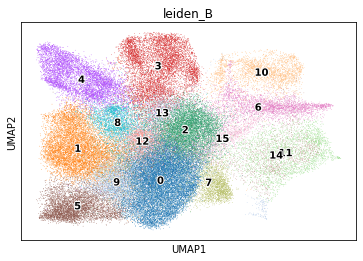

In [48]:
sc.tl.leiden(bdata, key_added = 'leiden_B')
sc.pl.umap(bdata, color = 'leiden_B', legend_loc = 'on data', legend_fontoutline = 2)

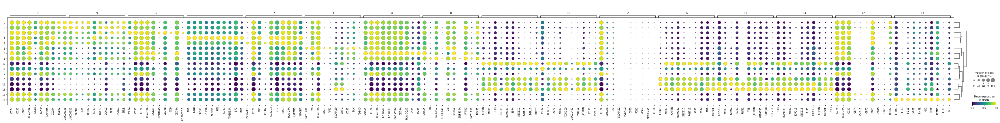

In [52]:
sc.tl.rank_genes_groups(bdata, groupby = 'leiden_B')
sc.pl.rank_genes_groups_dotplot(bdata, min_logfoldchange =.58, n_genes=10, standard_scale = 'var',  color_map = 'viridis')

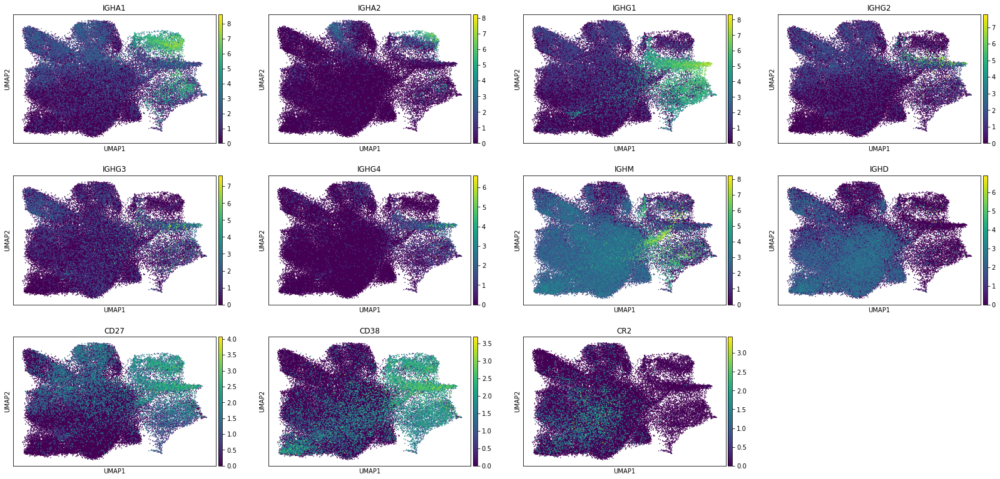

In [63]:
sc.pl.umap(bdata, color=['IGHA1', 'IGHA2', 'IGHG1', 'IGHG2', 'IGHG3', 'IGHG4', 'IGHM', 'IGHD', 'CD27', 'CD38', 'CR2'], size = 10)

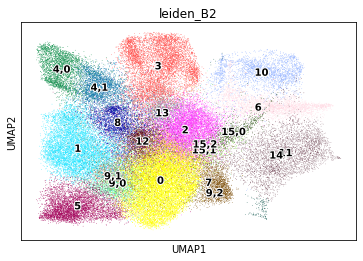

In [144]:
sc.tl.leiden(bdata, key_added = 'leiden_B2', restrict_to = ('leiden_B', ['15']), resolution = 0.3)
sc.tl.leiden(bdata, key_added = 'leiden_B2', restrict_to = ('leiden_B2', ['9']), resolution = 0.3)
sc.tl.leiden(bdata, key_added = 'leiden_B2', restrict_to = ('leiden_B2', ['4']), resolution = 0.3)
sc.pl.umap(bdata, color = 'leiden_B2', legend_loc = 'on data', legend_fontoutline = 2)

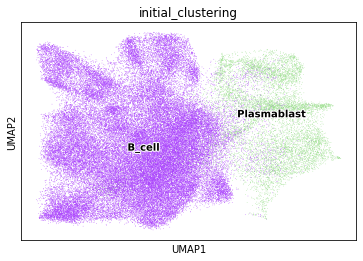

In [145]:
sc.pl.umap(bdata, color = 'initial_clustering', legend_loc = 'on data', legend_fontoutline = 2)

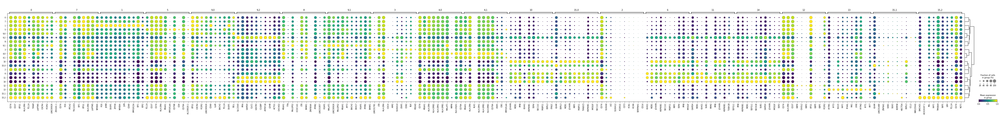

In [146]:
sc.tl.rank_genes_groups(bdata, groupby = 'leiden_B2')
sc.tl.dendrogram(bdata, groupby = 'leiden_B2')
sc.pl.rank_genes_groups_dotplot(bdata, min_logfoldchange =.58, n_genes=10, standard_scale = 'var',  color_map = 'viridis')

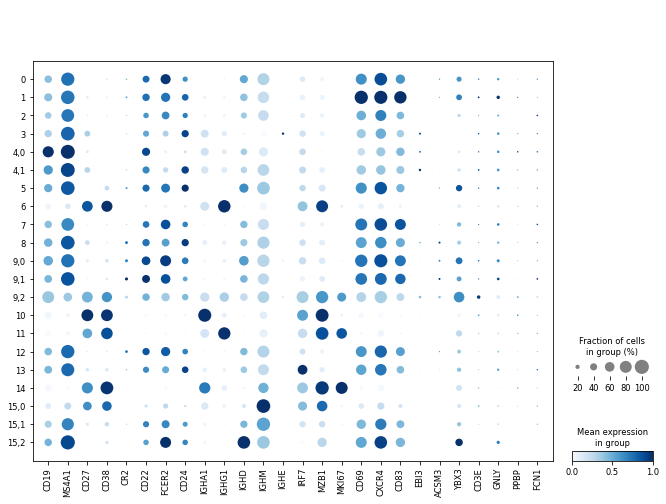

In [147]:
ax = sc.pl.dotplot(bdata, ['CD19', 'MS4A1', 'CD27', 'CD38', 'CR2', 'CD22', 'FCER2', 'CD24', 'IGHA1', 'IGHG1', 'IGHD', 'IGHM', 'IGHE', 'IRF7', 'MZB1', 'MKI67', 'CD69','CXCR4', 'CD83', 'EBI3', 'ACSM3', 'YBX3', 'CD3E', 'GNLY', 'PPBP', 'FCN1'], groupby = 'leiden_B2', standard_scale = 'var', return_fig=True)
ax.style(dot_edge_lw=0, cmap='Blues').show()

In [103]:
# B cell gene set tests
df1 = pd.read_csv('datasets/GSE22886_BcellGenesets.txt', sep = '\t', index_col = None, header = 0, na_filter=None)
df2 = pd.read_csv('datasets/GSE38697_GSE12845_BcellGenesets.txt', sep = '\t', index_col = None, header = 0, na_filter=None)
df3 = pd.read_csv('datasets/Bcell_genesets.txt', sep='\t', header=0, index_col = None, na_filter=False)
df4 = pd.read_csv('datasets/Monaco B cells.txt', sep='\t', header=0, index_col = None, na_filter=False)
df5 = pd.read_csv('datasets/GSE17186_transitionalBcells.txt', sep='\t', header=0, index_col = None, na_filter=False)
df6 = pd.read_csv('datasets/GSE12845_preGC_BcellGenesets.txt', sep='\t', header=0, index_col = None, na_filter=False)

In [134]:
def geneset_score(self, genesets, groupby, figsize=(3, 4), cmap = 'viridis', col_cluster = True, row_cluster = True):
    import numpy as np
    import seaborn as sns
    for s in genesets:
        sc.tl.score_genes(self, [y for y in genesets[s] if y != ''], use_raw = True, score_name= str(s)+'_score')
    # calculate average enrichment score
    list1 = list(set(self.obs[groupby]))
    subset = self.obs[[groupby] + [str(s)+'_score' for s in genesets]]
    output = pd.DataFrame()
    for x in list1:
        subsetX = subset[subset[groupby] == x]
        outdict = {}
        for k in [str(s)+'_score' for s in genesets]:
            out = {k:np.mean(subsetX[k])}
            outdict.update(out)
        output = output.append(outdict, ignore_index=True)
    output.index = list1
    output = output[[str(s)+'_score' for s in genesets]]
    g = sns.clustermap(output.transpose(), standard_scale = 0, cmap=cmap, figsize=figsize, col_cluster = col_cluster, row_cluster = row_cluster)
    sc.pl.umap(self, color = [str(s)+'_score' for s in genesets], size = 10, ncols = 2)
    print(g)

In [148]:
tmp = bdata.copy()

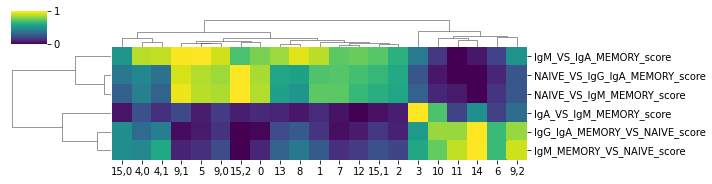

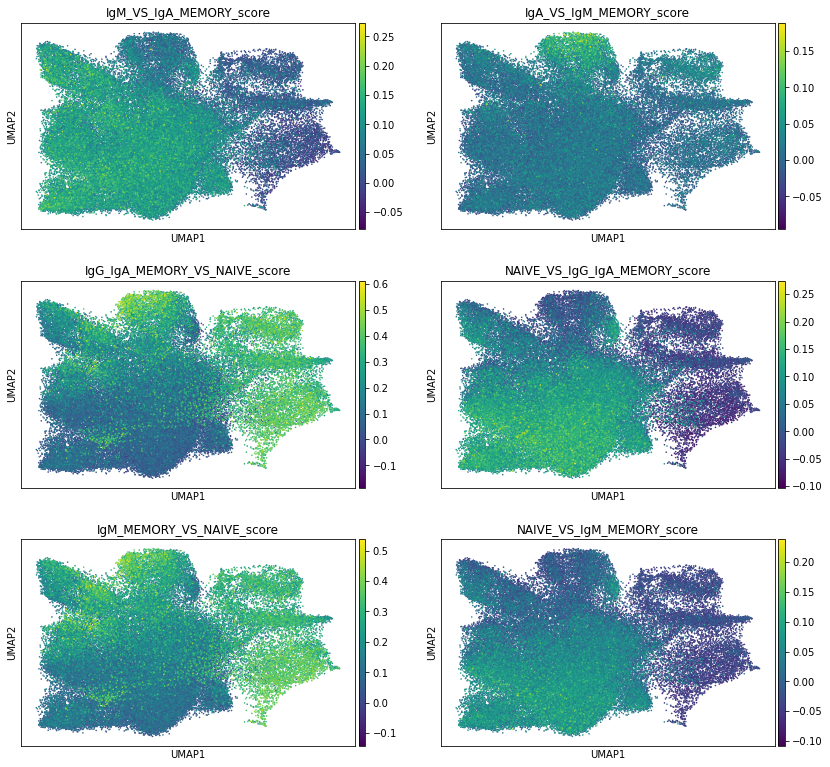

In [149]:
geneset_score(tmp, df1, 'leiden_B2', (10,2.5))

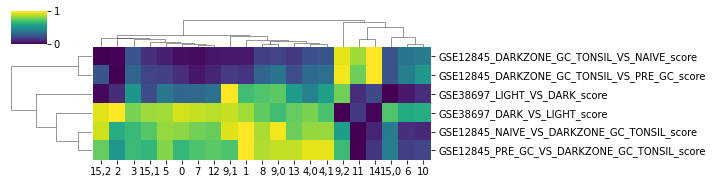

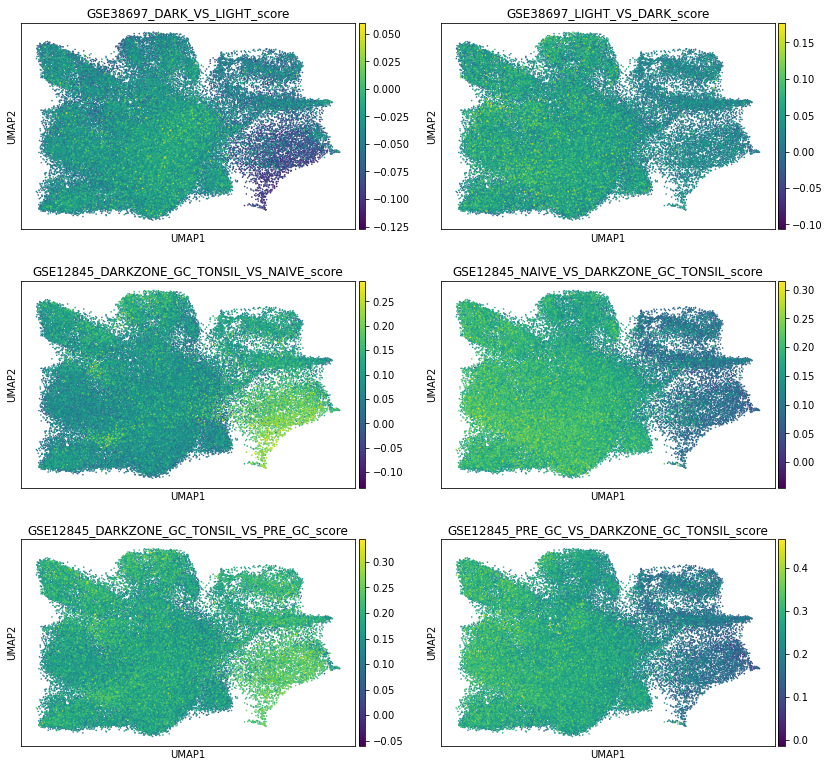

In [150]:
geneset_score(tmp, df2, 'leiden_B2', (10,2.5))

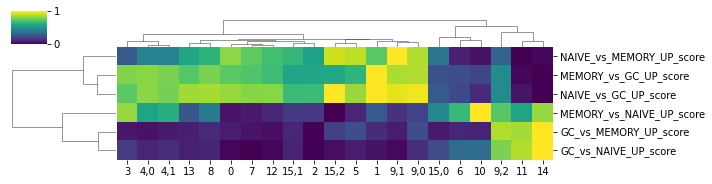

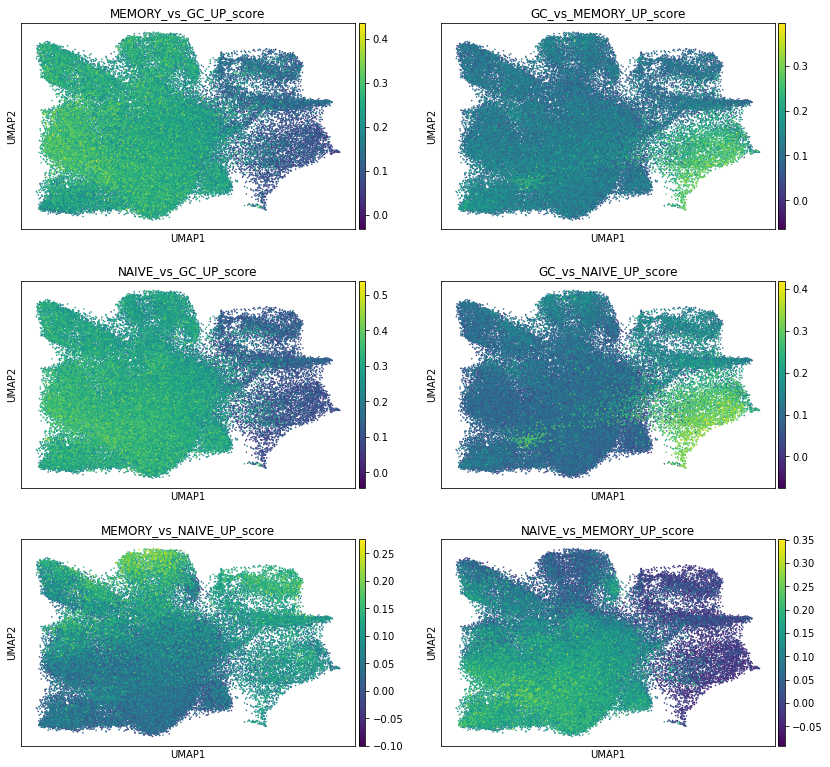

In [151]:
geneset_score(tmp, df3, 'leiden_B2', (10,2.5))

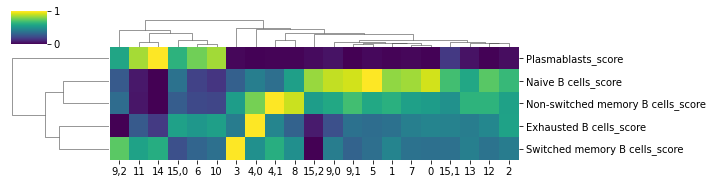

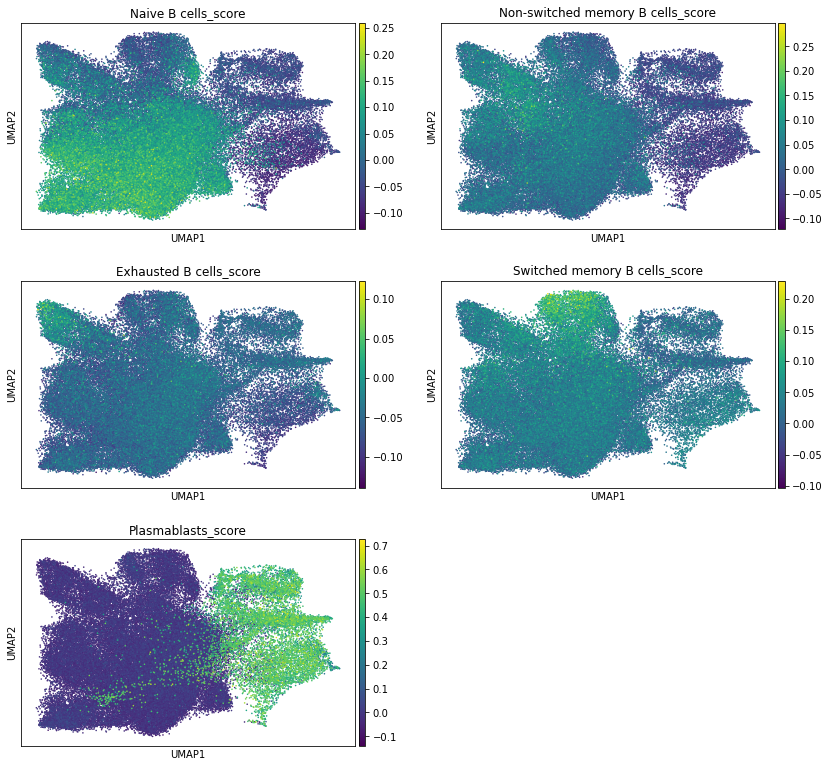

In [152]:
geneset_score(tmp, df4, 'leiden_B2', (10,2.5))

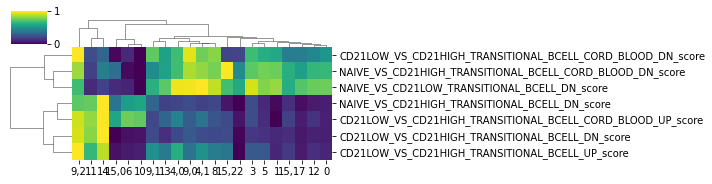

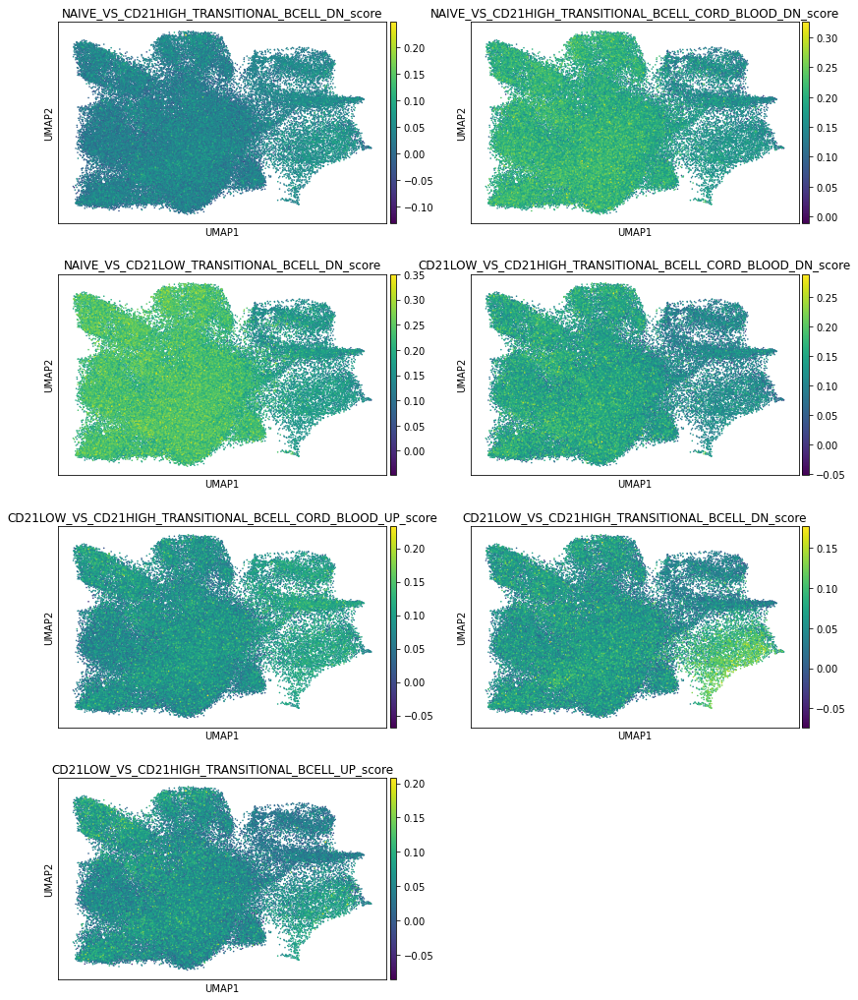

In [153]:
geneset_score(tmp, df5, 'leiden_B2', (10,2.5))

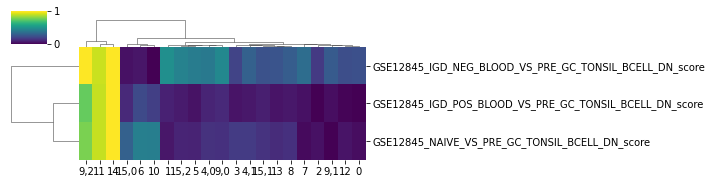

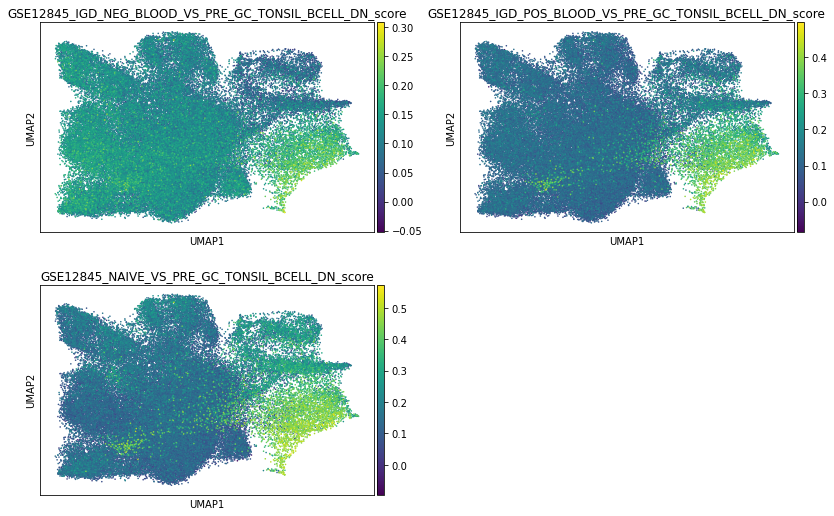

In [154]:
geneset_score(tmp, df6, 'leiden_B2', (10,2.5))

In [155]:
# check the HCA BM cell types
hcabm = sc.read_h5ad('/nfs/team297/kt16/scDatasets/Ben/HCA_bonemarrow_bcells.h5ad')
hcabm.raw = hcabm
sc.tl.rank_genes_groups(hcabm, groupby = 'celltype')
# we extract the DEGs as genesets
def returnDEres(adata, key, column, remove_mito_ribo = True):
    scores = pd.DataFrame(data = adata.uns[key]['scores'][column], index = adata.uns[key]['names'][column])
    lfc = pd.DataFrame(data = adata.uns[key]['logfoldchanges'][column], index = adata.uns[key]['names'][column])
    pvals = pd.DataFrame(data = adata.uns[key]['pvals'][column], index = adata.uns[key]['names'][column])
    padj = pd.DataFrame(data = adata.uns[key]['pvals_adj'][column], index = adata.uns[key]['names'][column])
    try:
        pts = pd.DataFrame(data = adata.uns[key]['pts'][column], index = adata.uns[key]['names'][column])
    except:
        pass
    scores = scores.loc[scores.index.dropna()]
    lfc = lfc.loc[lfc.index.dropna()]
    pvals = pvals.loc[pvals.index.dropna()]
    padj = padj.loc[padj.index.dropna()]
    try:
        pts = pts.loc[pts.index.dropna()]
    except:
        pass
    try:
        dfs = [scores, lfc, pvals, padj, pts]
    except:
        dfs = [scores, lfc, pvals, padj]
    df_final = functools.reduce(lambda left,right: pd.merge(left,right,left_index = True, right_index = True), dfs)
    try:
        df_final.columns = ['scores', 'logfoldchanges', 'pvals', 'pvals_adj', 'pts']
    except:
        df_final.columns = ['scores', 'logfoldchanges', 'pvals', 'pvals_adj']
    if remove_mito_ribo:
        df_final = df_final[~df_final.index.isin(list(df_final.filter(regex='^RPL|^RPS|^MRPS|^MRPL|^MT-', axis = 0).index))]	
    return(df_final)
import functools
hsc = returnDEres(hcabm, 'rank_genes_groups', 'HSC')
bcell = returnDEres(hcabm, 'rank_genes_groups', 'B cell')
immbcell = returnDEres(hcabm, 'rank_genes_groups', 'Immature B cell')
probcell = returnDEres(hcabm, 'rank_genes_groups', 'pro B cell')
preprobcell = returnDEres(hcabm, 'rank_genes_groups', 'pre pro B cell')
prebcell = returnDEres(hcabm, 'rank_genes_groups', 'pre B cell')
hsc = list(hsc[(hsc['pvals_adj'] < 0.05) & (hsc['logfoldchanges'] > .58)].head(n=250).index)
bcell = list(bcell[(bcell['pvals_adj'] < 0.05) & (bcell['logfoldchanges'] > .58)].head(n=250).index)
immbcell = list(immbcell[(immbcell['pvals_adj'] < 0.05) & (immbcell['logfoldchanges'] > .58)].head(n=250).index)
probcell = list(probcell[(probcell['pvals_adj'] < 0.05) & (probcell['logfoldchanges'] > .58)].head(n=250).index)
preprobcell = list(preprobcell[(preprobcell['pvals_adj'] < 0.05) & (preprobcell['logfoldchanges'] > .58)].head(n=250).index)
prebcell = list(prebcell[(prebcell['pvals_adj'] < 0.05) & (prebcell['logfoldchanges'] > .58)].head(n=250).index)
df7 = pd.DataFrame([hsc, bcell, immbcell, probcell, preprobcell, prebcell]).T
df7.columns = ['HSC', 'B cell', 'Immature B cell', 'pro B cell', 'pre pro B cell', 'pre B cell']

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


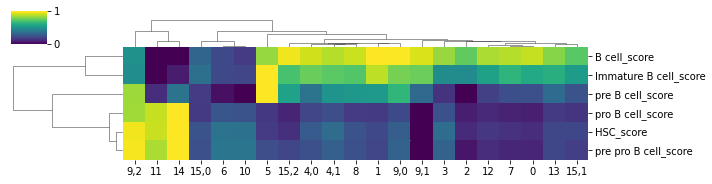

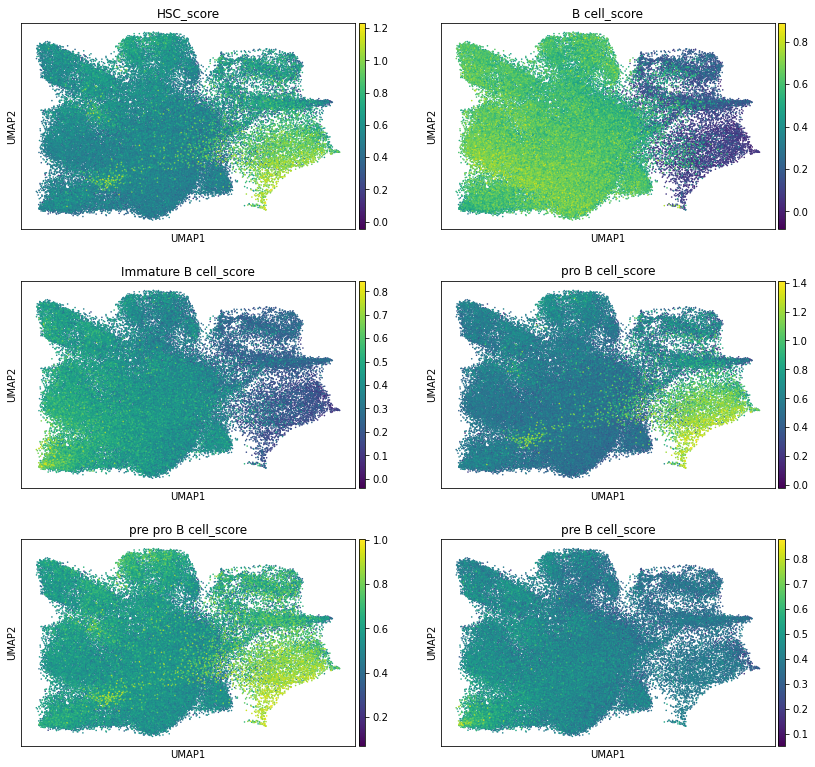

In [156]:
geneset_score(tmp, df7, 'leiden_B2', (10,2.5))

In [160]:
b_dict = {
'0':'B_naive',
'1':'B_naive',
'2':'B_naive',
'3':'B_switched_memory',
'4,0':'B_exhausted',
'4,1':'B_non-switched_memory',
'5':'B_immature',
'6':'Plasma_cell_IgG',
'7':'B_naive',
'8':'B_naive',
'9,0':'B_naive',
'9,1':'B_naive',
'9,2':'Plasmablast',
'10':'Plasma_cell_IgA',
'11':'Plasmablast',
'12':'B_naive',
'13':'B_naive',
'14':'Plasmablast',
'15,0':'Plasma_cell_IgM',
'15,1':'B_naive',
'15,2':'B_naive',
}

b_dict2 = {
'0':'B_naive',
'1':'B_naive',
'2':'B_naive',
'3':'B_switched_memory',
'4,0':'B_exhausted',
'4,1':'B_non-switched_memory',
'5':'B_immature',
'6':'Plasma_cell',
'7':'B_naive',
'8':'B_naive',
'9,0':'B_naive',
'9,1':'B_naive',
'9,2':'Plasmablast',
'10':'Plasma_cell',
'11':'Plasmablast',
'12':'B_naive',
'13':'B_naive',
'14':'Plasmablast',
'15,0':'Plasma_cell',
'15,1':'B_naive',
'15,2':'B_naive',
}

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'celltype_B' as categorical
... storing 'celltype_B_v2' as categorical


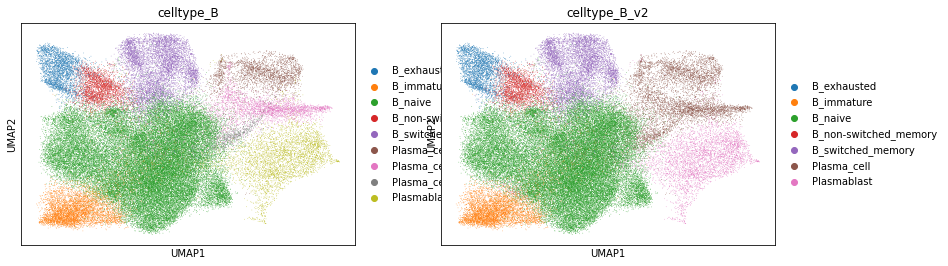

In [161]:
bdata.obs['celltype_B'] = [b_dict[b] for b in bdata.obs['leiden_B2']]
bdata.obs['celltype_B_v2'] = [b_dict2[b] for b in bdata.obs['leiden_B2']]
sc.pl.umap(bdata, color = ['celltype_B', 'celltype_B_v2'])

In [163]:
bdata.obs['celltype_B'] = bdata.obs['celltype_B'].cat.reorder_categories(['B_immature', 'B_naive', 'B_non-switched_memory', 'B_switched_memory', 'B_exhausted', 'Plasmablast', 'Plasma_cell_IgM', 'Plasma_cell_IgA', 'Plasma_cell_IgG'])
bdata.obs['celltype_B_v2'] = bdata.obs['celltype_B_v2'].cat.reorder_categories(['B_immature', 'B_naive', 'B_non-switched_memory', 'B_switched_memory', 'B_exhausted', 'Plasmablast', 'Plasma_cell'])
bdata.obs['Status_on_day_collection_summary'] = bdata.obs['Status_on_day_collection_summary'].cat.reorder_categories(['Healthy', 'Asymptomatic', 'Mild', 'Moderate', 'Severe', 'Critical', 'Non_covid', 'LPS'])

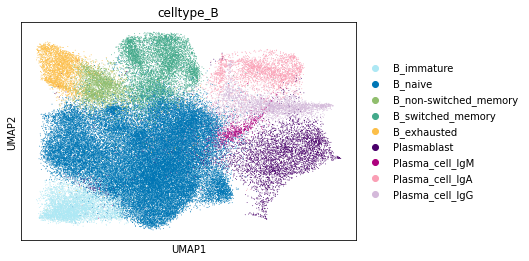

In [164]:
sc.pl.umap(bdata, color = 'celltype_B', palette = ['#ade8f4','#0077b6','#90be6d','#43aa8b','#fcbf49','#49006a','#ae017e','#fa9fb5','#d4b9da'], size = 3)

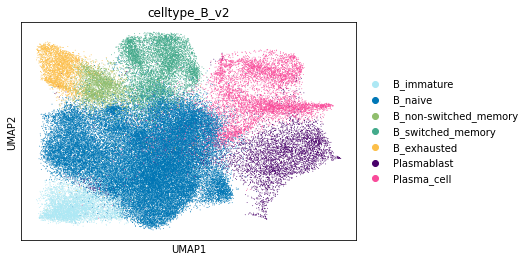

In [165]:
sc.pl.umap(bdata, color = 'celltype_B_v2', palette = ['#ade8f4','#0077b6','#90be6d','#43aa8b','#fcbf49','#49006a','#F94B9A'], size = 3)

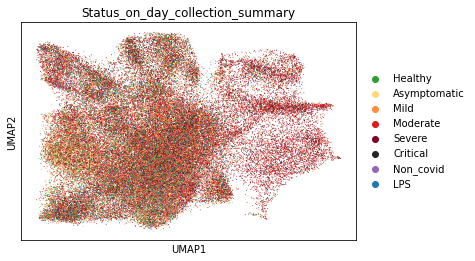

In [166]:
sc.pl.umap(bdata, color = 'Status_on_day_collection_summary', palette = ['#2ca02c','#fed976','#fd8d3c','#e31a1c','#800026','#252525','#9467bd','#1f77b4'], size = 3)

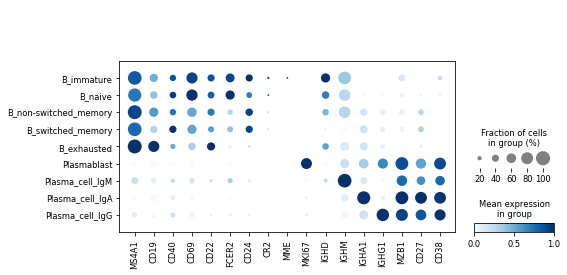

In [168]:
ax = sc.pl.dotplot(bdata, 
                   ['MS4A1', 'CD19', 'CD40', 'CD69', 'CD22', 'FCER2', 'CD24', 'CR2', 'MME', 'MKI67', 'IGHD', 'IGHM', 'IGHA1', 'IGHG1', 'MZB1', 'CD27', 'CD38'],
                   groupby = 'celltype_B',  
                   standard_scale = 'var', color_map = 'Blues', return_fig=True)
ax.style(dot_edge_lw=0, cmap = 'Blues')
ax.show()
# ax.savefig('figures/dotplot/Bcell_trans_markers.pdf')

In [171]:
all(bprotein.obs_names == bdata.obs_names)

True

In [172]:
bprotein.obs = bdata.obs.copy()
bprotein.uns = bdata.uns.copy()
bprotein.obsm = bdata.obsm.copy()

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


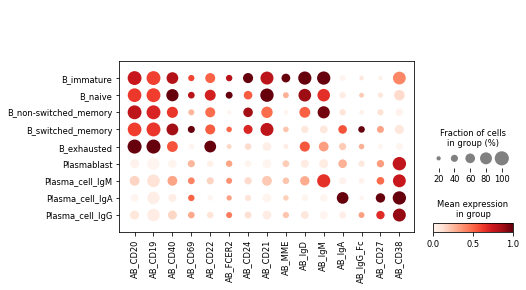

In [173]:
ax = sc.pl.dotplot(bprotein, 
                     ['AB_CD20', 'AB_CD19', 'AB_CD40', 'AB_CD69', 'AB_CD22', 'AB_FCER2', 'AB_CD24', 'AB_CD21', 'AB_MME', 'AB_IgD', 'AB_IgM', 'AB_IgA', 'AB_IgG_Fc', 'AB_CD27', 'AB_CD38'],
                     groupby = 'celltype_B',  
                     standard_scale = 'var', color_map = 'Reds', return_fig=True)
ax.style(dot_edge_lw=0, cmap = 'Reds')
ax.show()

In [174]:
bdata

AnnData object with n_obs × n_vars = 74019 × 1064
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr', 'initial_clustering_B', 'leiden_B', 'leiden_B2', 'celltype_B', 'celltype_B_v2'
    var: 'feature_types', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_B_colors', 'rank_genes

In [175]:
bdata_raw = rna[(rna.obs['initial_clustering_B'].isin(['B_cell', 'Plasmablast'])) & ~(rna.obs['patient_id'].isin(['CV0198', 'nan']))].copy()
bdata_raw

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead


AnnData object with n_obs × n_vars = 74019 × 31087
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr', 'initial_clustering_B'
    var: 'feature_types'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

In [176]:
all(bdata_raw.obs_names == bdata.obs_names)

True

In [177]:
bdata_raw.obs = bdata.obs.copy()
bdata_raw.uns = bdata.uns.copy()
bdata_raw.obsm = bdata.obsm.copy()

In [184]:
bdata_raw = bdata_raw[:, bdata_raw.var.feature_types == 'Gene Expression']
bdata_raw

View of AnnData object with n_obs × n_vars = 74019 × 31087
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr', 'initial_clustering_B', 'leiden_B', 'leiden_B2', 'celltype_B', 'celltype_B_v2'
    var: 'feature_types'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_B_colors', 'rank_genes_groups', "dendrogram_['leiden_B']", "dendrogram_['leiden_B2']", 'cel

In [178]:
# update the original object
adata.obs['celltype_B'] = pd.Series(bdata.obs['celltype_B'])
adata.obs['celltype_B_v2'] = pd.Series(bdata.obs['celltype_B_v2'])

In [179]:
# also update the B cells from CV0198 and just call them B_malignant
adata.obs['celltype_B'] = adata.obs['celltype_B'].astype('object')
adata.obs['celltype_B_v2'] = adata.obs['celltype_B_v2'].astype('object')
for i in adata.obs.index:
    if adata.obs.at[i, 'patient_id'] == 'CV0198' and adata.obs.at[i, 'initial_clustering_B'] == 'B_cell':
        adata.obs.at[i, 'celltype_B'] = 'B_malignant'
        adata.obs.at[i, 'celltype_B_v2'] = 'B_malignant'
    if adata.obs.at[i, 'patient_id'] == 'CV0198' and adata.obs.at[i, 'initial_clustering_B'] == 'Plasmablast':
        adata.obs.at[i, 'celltype_B'] = 'B_malignant'
        adata.obs.at[i, 'celltype_B_v2'] = 'B_malignant'

In [180]:
adata.obs['Status_on_day_collection_summary'] = adata.obs['Status_on_day_collection_summary'].cat.reorder_categories(['Healthy', 'Asymptomatic', 'Mild', 'Moderate', 'Severe', 'Critical', 'Non_covid', 'LPS', 'nan'])

In [181]:
adata

AnnData object with n_obs × n_vars = 850100 × 31279
    obs: 'sample_id', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'initial_clustering', 'Resample', 'Collection_Day', 'patient_id', 'Sex', 'Age', 'Ethnicity', 'Swab_result', 'Status', 'Smoker', 'Status_on_day_collection', 'Status_on_day_collection_summary', 'Status_3_days_post_collection', 'Status_7_days_post_collection', 'Days_from_onset', 'Site', 'time_after_LPS', 'Worst_Clinical_Status', 'Outcome', 'filter_rna', 'has_bcr', 'filter_bcr_quality', 'filter_bcr_heavy', 'filter_bcr_light', 'bcr_QC_pass', 'filter_bcr', 'initial_clustering_B', 'celltype_B', 'celltype_B_v2'
    var: 'feature_types'
    uns: 'Site_colors', 'bcr_QC_pass_colors', 'filter_bcr_colors', 'initial_clustering_colors', 'leiden_colors'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'

/nfs/users/nfs_k/kt16/miniconda2/envs/dandelion/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
... storing 'initial_clustering_B' as categorical
... storing 'celltype_B' as categorical
... storing 'celltype_B_v2' as categorical


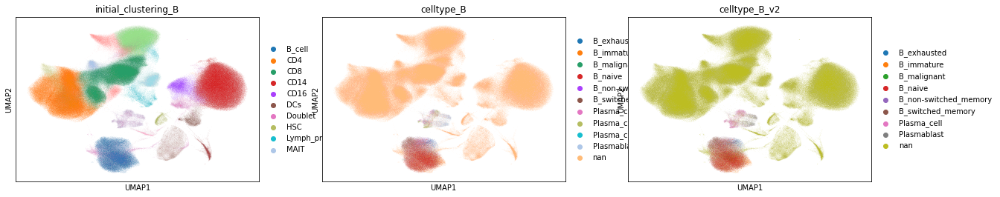

In [182]:
sc.pl.umap(adata, color = ['initial_clustering_B', 'celltype_B', 'celltype_B_v2'])

In [185]:
# save!!!!
adata.write('h5ad/combined_dec.h5ad', compression = 'gzip')
bdata.write('h5ad/combined_dec_bcells.h5ad', compression = 'gzip')
bprotein.write('h5ad/combined_dec_bcells_protein.h5ad', compression = 'gzip')
bdata_raw.write('h5ad/combined_dec_bcells_raw.h5ad', compression = 'gzip')